# Clear-sky analysis plots for the paper

In this notebook, you find all the plots used in the paper about visible channel.

## Import libraries and data

In [ ]:
### DO NOT RUN THIS CELL !!!!!

### KEPT FOR MY (SANDY) REFERENCE BEFORE CODE PUBLICATION

# Import libraries and needed paths
import sys
import pygrib
import matplotlib.ticker as mtick
sys.path.append("/perm/km4c/RTTOV_AROME/")
sys.path.append("/perm/km4c/RTTOV_AROME/read_output_results_visible/")
sys.path.append("/perm/km4c/RTTOV_AROME/clear_sky_analysis/")
sys.path.append("/etc/ecmwf/nfs/dh2_home_b/km4c/.local/lib/python3.8/site-packages")

from notebook_functions import *
from results_vis_clr_sky_a2 import *
from notebook_functions import *
from visir_profiles_arome import get_profile
from visir_obs_utils import *

# used to mask out data points beyond model domain limits
domain_mask = np.load("/perm/km4c/RTTOV_AROME/Masks_visible/AROME_Mask.npy")

In [23]:
import sys

sys.path.append("/perm/km4c/RTTOV_AROME")
sys.path.append("/etc/ecmwf/nfs/dh2_home_b/km4c/.local/lib/python3.8/site-packages")
sys.path.append("/perm/km4c/RTTOV_AROME/read_output_data")
sys.path.append("/perm/km4c/RTTOV_AROME/plot_results")

from results_vis_clr_sky_a2 import *
from utils1 import *
from utils2 import *

# Used to mask data points beyond the AROME model domain
domain_mask = np.load("/perm/km4c/RTTOV_AROME/masks/AROME_Mask.npy")

In [24]:
# Read the Elevation height
import pygrib
sys.path.append("/perm/km4c/RTTOV_AROME/run_rttov")
from visir_profiles_arome import *
from visir_obs_utils import map_to_sat_grid_edited
grbs = []
grb_path = f"/etc/ecmwf/hpcperm/km4c/arome_forecasts/august23/day_01/20230801_12_0003.grb"
tmp = pygrib.open(grb_path)
grbs.append(tmp)
z_surface = get_profile(grbs, 0, 8, "surface", plot_par = False)
terrain, _ = map_to_sat_grid_edited(z_surface.data[0,:,:], channel='', varname='refl', plot_only_latlon=False, 
                                    vmin=None, vmax=None, cmap=None, save_tile=False, dbg=False, repo_path='/perm/km4c/')
H = (terrain*domain_mask)/1000

latlon2xy constants  0.731991592560469 1.836504601854703 1.0103403109190163
misses in latlon2tri_exact_exec:  57644


## Shadowing effects

In [4]:
# Define hours
hours = ["060000","090000", "120000", "150000"] 

# Initialize results dictionaries
Results_1 = {"O": {}, "B-visop": {}, "B-rttov12": {}, "B-rttov13": {}}  # Darkest-pixel approach to derive clear sky pixels
Results_2 = {"O": {}, "B-visop": {}, "B-rttov12": {}, "B-rttov13": {}}  # Mean-pixel approach to derive clear sky pixels
Albedo = {}

# Populate the results
for hour in hours:
    # Calculate values for each hour
    Results_1["O"][hour] = visop.clear_observed[hour].values * domain_mask
    Results_1["B-visop"][hour] = visop.clear_synthetic["darkest-pixel"][hour].values * domain_mask
    Results_1["B-rttov12"][hour] = rttov122.clear_synthetic["darkest-pixel"][hour].values * domain_mask
    Results_1["B-rttov13"][hour] = rttov132.clear_synthetic["darkest-pixel"][hour].values * domain_mask
    Albedo[hour] = rttov122.albedo_from_atlas[hour].values * domain_mask

In [5]:
import numpy as np
from scipy import stats

def pearsonr_ci(x,y,alpha=0.05):
    ''' calculate Pearson correlation along with the confidence interval using scipy and numpy
    Parameters
    ----------
    x, y : iterable object such as a list or np.array
      Input for correlation calculation
    alpha : float
      Significance level. 0.05 by default
    Returns
    -------
    r : float
      Pearson's correlation coefficient
    pval : float
      The corresponding p value
    lo, hi : float
      The lower and upper bound of confidence intervals
    '''

    r, p = stats.pearsonr(x,y)
    r_z = np.arctanh(r)
    se = 1/np.sqrt(x.size-3)
    z = stats.norm.ppf(1-alpha/2)
    lo_z, hi_z = r_z-z*se, r_z+z*se
    lo, hi = np.tanh((lo_z, hi_z))
    return r, p, lo, hi

In [6]:
# Example usage:
# (100, 102), (250, 295)
LON = rttov122.data.lon_obs_map.values    # shape (n_lat, n_lon)
LAT = rttov122.data.lat_obs_map.values    # same shape

hour = "060000"
o06 = Results_1["O"][hour]
b06 = Results_1["B-rttov13"][hour]

hour = "090000"
o09 = Results_1["O"][hour]
b09 = Results_1["B-rttov13"][hour]

hour = "120000"
o12 = Results_1["O"][hour]
b12 = Results_1["B-rttov13"][hour]
a12 = Albedo[hour]
print('correlation %.2f, p value %.2f, confidence intervals [%.2f, %.2f]'%pearsonr_ci(flatten_array(a12),flatten_array(o12-b12),alpha=0.05))

hour = "150000"
o15 = Results_1["O"][hour]
b15 = Results_1["B-rttov13"][hour]

correlation 0.08, p value 0.00, confidence intervals [0.07, 0.09]


In [24]:
def fmt(x):
    s = f"{x:.1f}"
    if s.endswith("0"):
        s = f"{x:.0f}"
    return rf"{s}" if plt.rcParams["text.usetex"] else f"{s}"

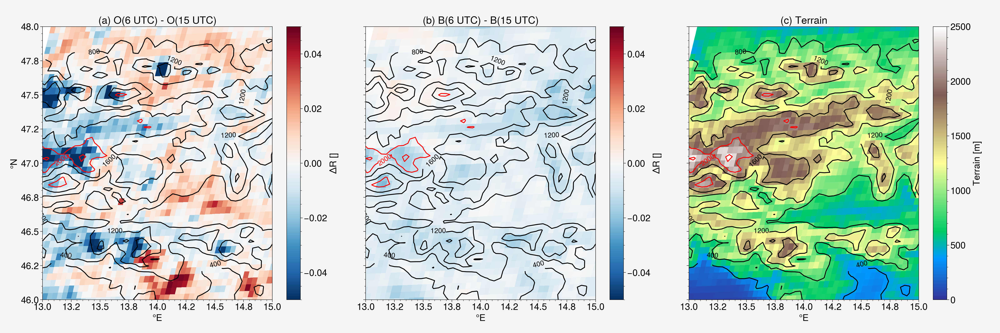

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# --- your existing slice and data prep ---
r1, r2 = 80, 150
c1, c2 = 240, 300
x = LON[r1:r2, c1:c2]
y = LAT[r1:r2, c1:c2]
z_terrain = H[r1:r2, c1:c2] * 1000

diff_O = o06[r1:r2, c1:c2] - o15[r1:r2, c1:c2]
diff_B = b06[r1:r2, c1:c2] - b15[r1:r2, c1:c2]

# --- create a 1×3 figure ---
fig, axes = plt.subplots(1, 3, figsize=(24, 8), sharex=True, sharey=True)
plt.rcParams.update({'font.size': 16})

# common formatter for lon/lat
for ax in axes:
    ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.1f'))
    ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1f'))
    ax.set_xlim(13, 15)
    ax.set_ylim(46, 48)
    ax.set_xlabel("°E")
axes[0].set_ylabel("°N")

# --- panel 1: O difference ---
pcm1 = axes[0].pcolormesh(x, y, diff_O,
                          vmin=-0.05, vmax=0.05,
                          cmap='RdBu_r', shading='auto')
cbar1 = fig.colorbar(pcm1, ax=axes[0], label="ΔR []")
#cont1 = axes[0].contour(x, y, z_terrain,
#                       levels=5, color='black', linewidths=1.8)
CS = axes[0].contour(x, y, z_terrain, levels=[400,800,1200,1600], colors='black')

cl = axes[0].clabel(CS, CS.levels, fmt='%10.0f', inline=True, fontsize=12,inline_spacing=-5)

CS = axes[0].contour(x, y, z_terrain, levels=[2000,2400], colors='red')
axes[0].clabel(CS, fmt='%1.0f', fontsize=12,inline=True,inline_spacing=-5)
axes[0].set_title("(c) Terrain")

# CS = axes[0].contour(x, y, z_terrain, colors='black')

# axes[0].clabel(CS, CS.levels, fmt='%10.0f', fontsize=12)
# #axes[0].clabel(cont1, inline=True, colors='black', fmt='%10.0f')
# CS = axes[0].contour(x, y, z_terrain, levels=[2000], colors='red')
# axes[0].clabel(CS, fmt='%1.1f', fontsize=12)
axes[0].set_title("(a) O(6 UTC) - O(15 UTC)")

# --- panel 2: B difference ---
pcm2 = axes[1].pcolormesh(x, y, diff_B,
                          vmin=-0.05, vmax=0.05,
                          cmap='RdBu_r', shading='auto')
cbar2 = fig.colorbar(pcm2, ax=axes[1], label="ΔR []")
# CS = axes[1].contour(x, y, z_terrain, colors='black')
# # axes[1].clabel(CS, CS.levels, fmt='%10.0f', inline=True, fontsize=12)
# # axes[1].clabel(CS, CS.levels, fmt='%10.0f', fontsize=12)
# CS = axes[1].contour(x, y, z_terrain, levels=[2000], colors='red')
# axes[1].clabel(CS, fmt='%1.1f', fontsize=12)
axes[1].set_title("(b) B(6 UTC) - B(15 UTC)")
CS = axes[1].contour(x, y, z_terrain, levels=[400,800,1200,1600], colors='black')

cl = axes[1].clabel(CS, CS.levels, fmt='%10.0f', inline=True, fontsize=12,inline_spacing=-5)

CS = axes[1].contour(x, y, z_terrain, levels=[2000,2400], colors='red')
axes[1].clabel(CS, fmt='%1.0f', fontsize=12,inline=True,inline_spacing=-5)
# --- panel 3: terrain ---
pcm3 = axes[2].pcolormesh(x, y, z_terrain,
                          vmin=0, vmax=2500,
                          cmap='terrain', shading='auto')
cbar3 = fig.colorbar(pcm3, ax=axes[2], label="Terrain [m]")
CS = axes[2].contour(x, y, z_terrain, levels=[400,800,1200,1600], colors='black')

cl = axes[2].clabel(CS, CS.levels, fmt='%10.0f', inline=True, fontsize=12,inline_spacing=-5)

CS = axes[2].contour(x, y, z_terrain, levels=[2000,2400], colors='red')
axes[2].clabel(CS, fmt='%1.0f', fontsize=12,inline=True,inline_spacing=-5)
axes[2].set_title("(c) Terrain")

# --- layout & save ---
plt.tight_layout()
plt.subplots_adjust(top=0.92)   # if you need more room for suptitle/legends
plt.savefig("/home/km4c/to_ucloud/shadow_effects.png", dpi=1200)
plt.show()

In [16]:
CS.levels

array([-400.,    0.,  400.,  800., 1200., 1600., 2000., 2400., 2800.])

## Maps

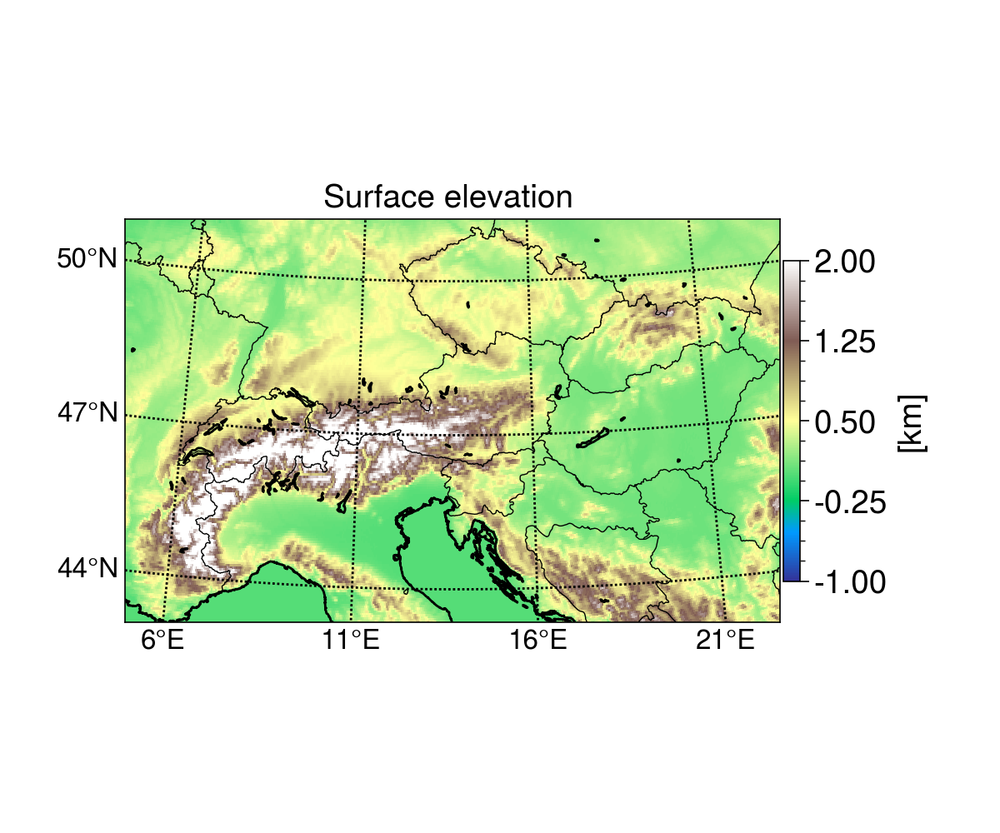

In [5]:
fig = geo_map_vis([H], ["Surface elevation"], cmaps=["terrain"],
            date="", unit="[km]",
            lon=rttov122.data.lon_obs_map.values, 
            lat=rttov122.data.lat_obs_map.values,
            vmin=-1.0, vmax=2.0,save=True,shrink=0.5,
            out_path='/home/km4c/to_ucloud/',
            name='surface_elevation'
            )

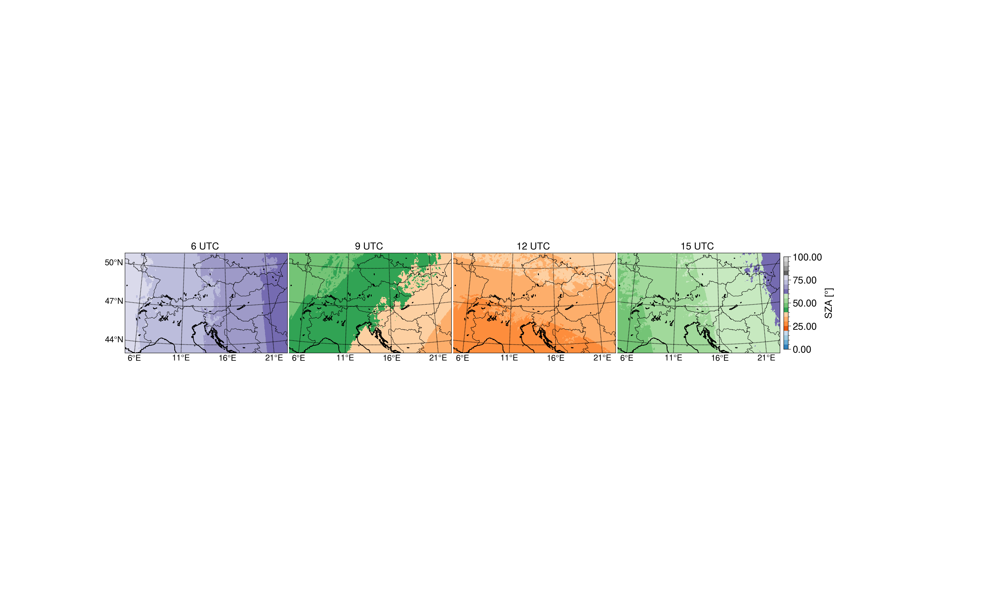

In [6]:
out_1 = rttov122.angles["SZA"]['060000'].values*domain_mask
out_2 = rttov122.angles["SZA"]['090000'].values*domain_mask
out_3 = rttov122.angles["SZA"]['120000'].values*domain_mask
out_4 = rttov122.angles["SZA"]['150000'].values*domain_mask

fig = geo_map_vis([out_1, out_2, out_3, out_4], ["6 UTC", "9 UTC", "12 UTC", "15 UTC"], cmaps=["tab20c", "tab20c","tab20c", "tab20c"],
            date="", unit="SZA [°]",
            lon=rttov122.data.lon_obs_map.values, lat=rttov122.data.lat_obs_map.values,
            vmin=0.0, vmax=100,save=True,
            out_path='/home/km4c/to_ucloud/',shrink=0.2,
            name=f'SZA_map_all_hours'
            )

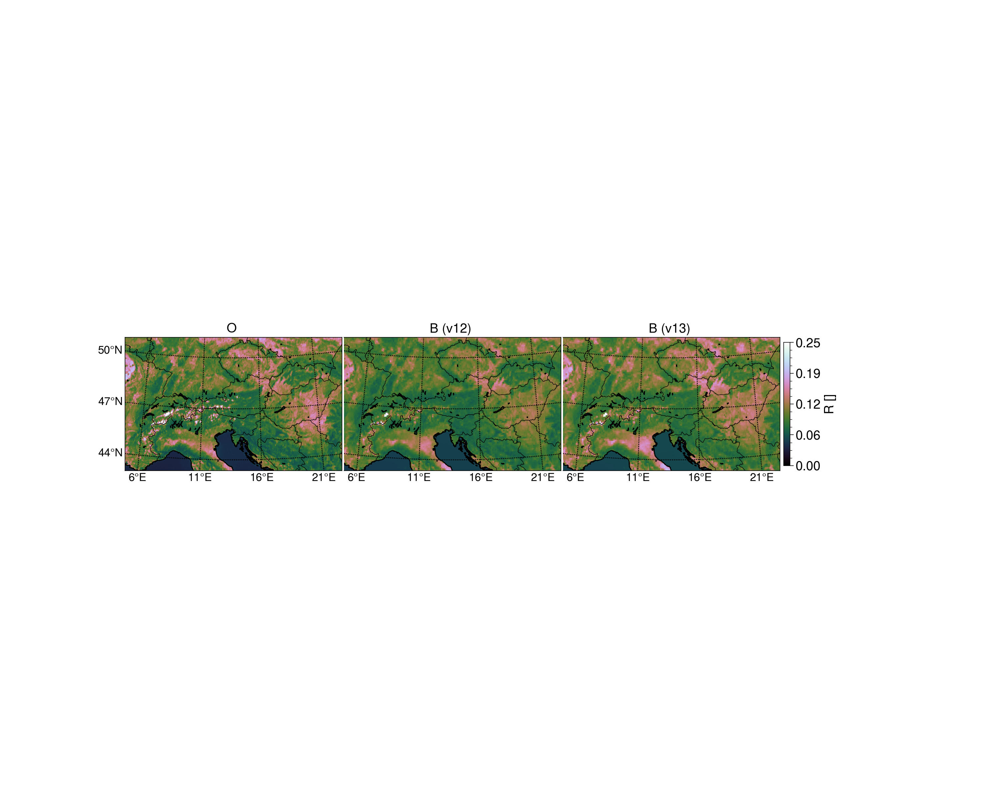

In [7]:
hours = ['060000','090000','120000','150000']
hour = '120000'
out_1 = visop.clear_observed[hour].values*domain_mask
out_2 = rttov122.clear_synthetic["darkest-pixel"][hour].values*domain_mask
out_3 = rttov132.clear_synthetic["darkest-pixel"][hour].values*domain_mask

fig = geo_map_vis([out_1, out_2, out_3], ["O", "B (v12)", "B (v13)"], cmaps=["cubehelix", "cubehelix","cubehelix"],
            date="", unit="R []",
            lon=rttov122.data.lon_obs_map.values, lat=rttov122.data.lat_obs_map.values,
            vmin=0.0, vmax=0.25,save=True,shrink=0.2,
            out_path='/home/km4c/to_ucloud/',
            name=f'Clr_Ref_map_{hour}'
            )

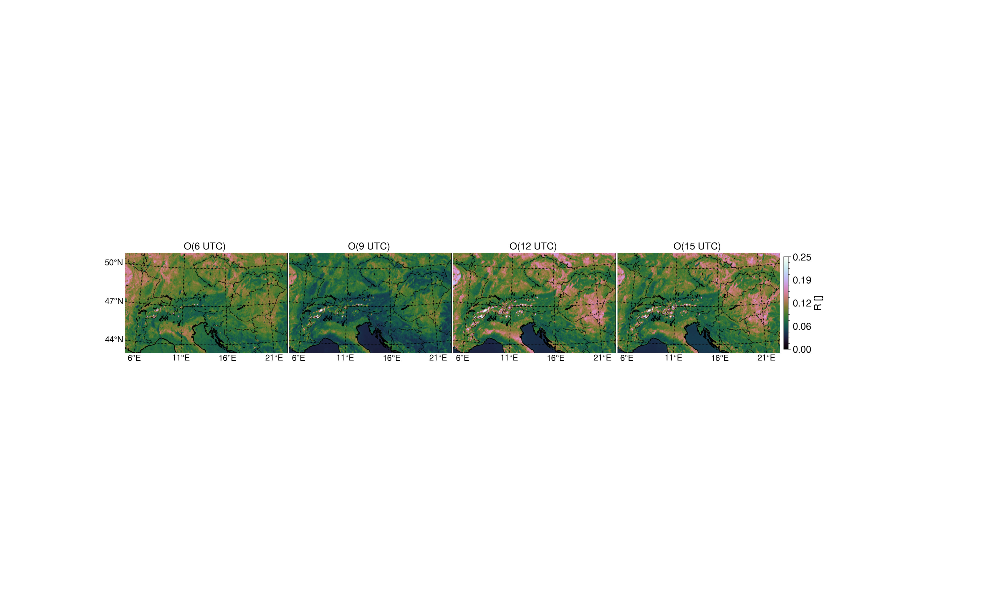

In [8]:
out_1 = visop.clear_observed['060000'].values*domain_mask
out_2 = visop.clear_observed['090000'].values*domain_mask
out_3 = visop.clear_observed['120000'].values*domain_mask
out_4 = visop.clear_observed['150000'].values*domain_mask

fig = geo_map_vis([out_1, out_2, out_3, out_4], ["O(6 UTC)", "O(9 UTC)", "O(12 UTC)", "O(15 UTC)"], cmaps=["cubehelix", "cubehelix","cubehelix", "cubehelix"],
            date="", unit="R []",
            lon=rttov122.data.lon_obs_map.values, lat=rttov122.data.lat_obs_map.values,
            vmin=0.0, vmax=0.25,save=True,
            out_path='/home/km4c/to_ucloud/',shrink=0.2,
            name=f'Clr_Ref_map_all_hours'
            )

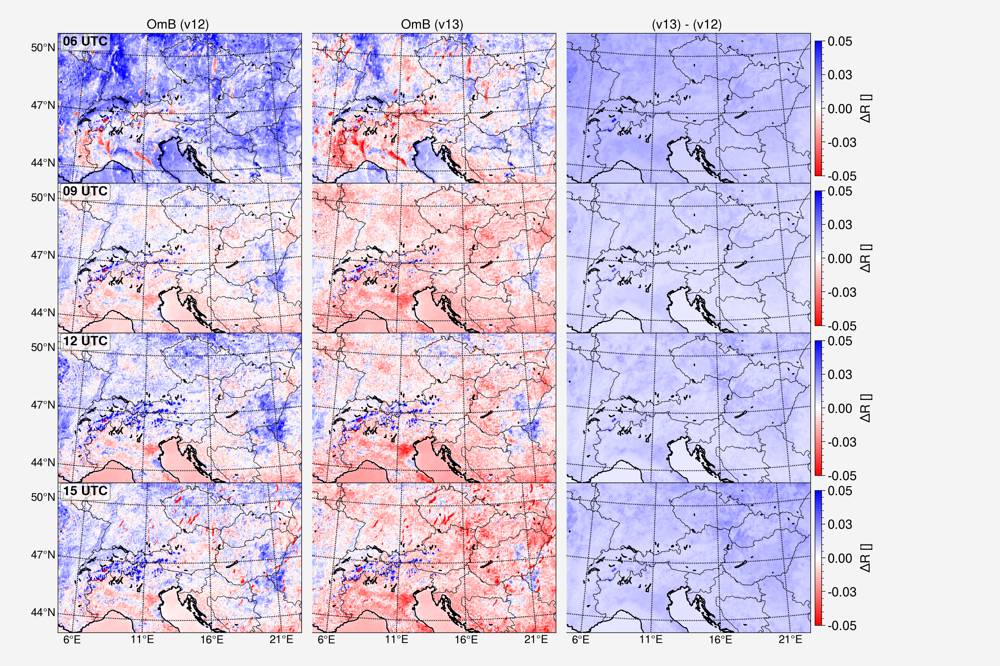

In [9]:
fig_OmB, axes = plt.subplots(4, 3,
                             figsize=(15,10),
                             constrained_layout=False)
fig_OmB.subplots_adjust(top=0.95,
                        bottom=0.05,
                        left=0.05,
                        right=0.95,
                        wspace=0.01,
                        hspace=0.0)

# split your rows
axes_rows = [axes[i, :] for i in range(4)]

for hour, ax_row in zip(hours, axes_rows):
    # compute out_1, out_2, out_3 as before…
    out_1 = visop.clear_observed[hour].values*domain_mask
    out_2 = rttov122.clear_synthetic["darkest-pixel"][hour].values*domain_mask
    out_3 = rttov132.clear_synthetic["darkest-pixel"][hour].values*domain_mask
    cmaps=["bwr_r", "bwr_r","bwr_r"]
    if hour == "060000":
        names=["OmB (v12)", "OmB (v13)", "(v13) - (v12)"]
    else:
        names = ["", "", ""]
    axs_flat = geo_map_vis([out_1-out_2, out_1-out_3, out_3-out_2],
                            names,
                            cmaps=cmaps,
                            lon=rttov122.data.lon_obs_map.values, 
                            lat=rttov122.data.lat_obs_map.values,
                            vmin=-0.05, vmax=0.05,
                            shrink=0.9,
                            date="",
                            unit="ΔR []",
                            axes=ax_row,
                            fig=fig_OmB)
    ax = ax_row[0]
    ax.text(0.02, 0.98, f"{hour[:-4]} UTC",
            transform=ax.transAxes,
            va='top', ha='left',
            fontsize=14, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.2', fc='white', alpha=0.6))
plt.show()

In [99]:
fig_OmB.savefig('my_OmB_comparison.png',
                dpi=300,
                bbox_inches='tight')

## Inspect the OmB values where SZA>75 and plot them on the map (@6utc)

Philipp is confused about whether the OmB mean values are consistent with the plotted OmB maps at 6 UTC (the OmB mean is largely negative compared to OmB values shown in the map). I (Sandy) will look at the OmB values where I have large SZA and then see if the values really make sense or not as a first check.

### Reading the data + Map where OmB < -0.09 where sza >75

In [52]:
hour = '060000'
o_1 = visop.clear_observed[hour].values*domain_mask
b_2 = rttov122.clear_synthetic["darkest-pixel"][hour].values*domain_mask
b_3 = rttov122.clear_synthetic["darkest-pixel"][hour].values*domain_mask

omb_2 = o_1 - b_2
omb_3 = o_1 - b_3

sza = rttov122.angles["SZA"][hour].values*domain_mask

result_2 = np.where(sza>75, omb_2, np.nan)
result_3 = np.where(result_2<-0.1, result_2, np.nan)
print(np.nanmin(result_2))
print(np.count_nonzero(~np.isnan(result_3)))

-0.21181093517380617
25


In [53]:
np.nanmax(sza)

79.80578997283263

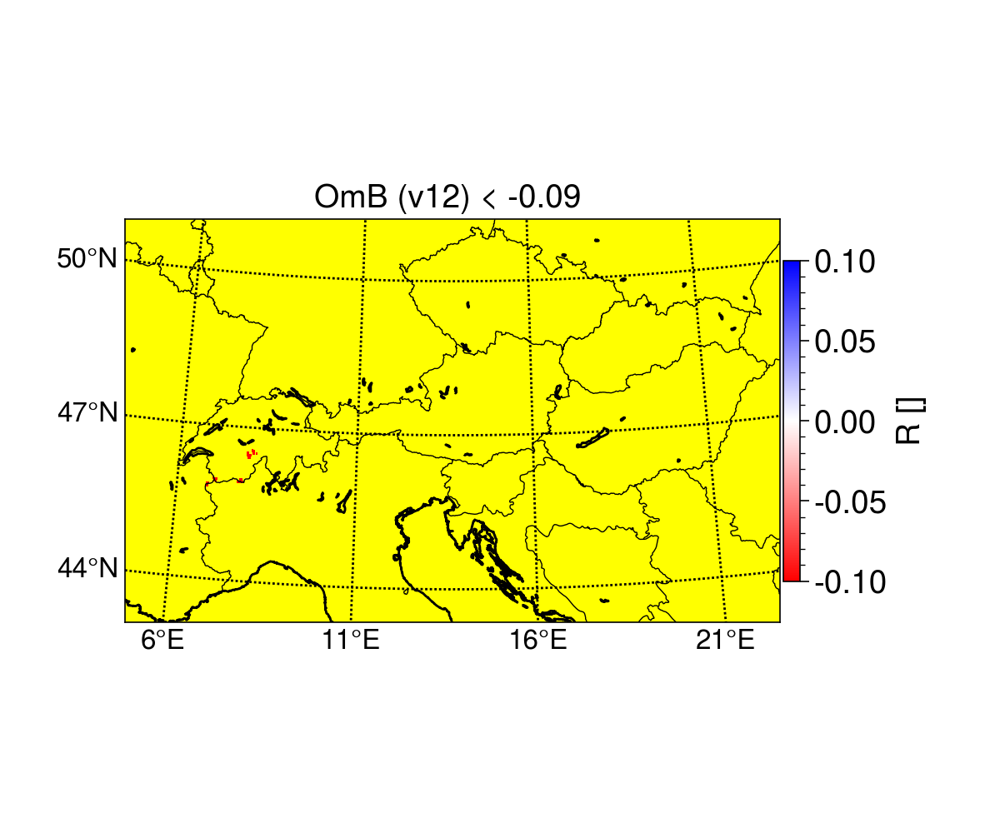

In [4]:
fig = geo_map_vis([result_3], ["OmB (v12) < -0.09"], cmaps=["bwr_r"],
            date="", unit="R []",
            lon=rttov122.data.lon_obs_map.values, lat=rttov122.data.lat_obs_map.values,
            vmin=-0.1, vmax=0.1,save=True,shrink=0.5,
            out_path='/home/km4c/to_ucloud/',
            name=f'test_6utc'
            )

### Previous binning method used and the resulting statistics

The choice of binning method is why we had a large negative OmB mean at large SZA. In the last bin of SZA, only a few OmB samples (see OmB_count column or subplot below) are largely negative. The choice of n_bins (I had in my function) can also lead to very different results.

Now, Philipp's code is similar to the function I wrote using pandas aggregate functions, except that he added a min_count threshold of 50, which basically means excluding the samples with large negative values as they are less than 50 (that my method did not exclude), and he also removed low sza at the edges.

What is important now:
- Negatively large OmB exit (only a few pixels in the map are hardly seen).
- An furthor issue that's now fixed: My old method assumed different bin ranges for each OmB dataset (because I used SZA.min and SZA.max to calculate the bin ranges). This is not reliable when we want to compare OmB means vs SZA at different times. Therefore, the bin range must be consistent for all times.
- Philipp's result yielded results for sza_bin_mean = 81 degrees which my method didn't yield. But, at 6 UTC, sza max = 79.80 from my data. From Philipps reading we find max sza = 81. I would stick with my result. 

In [59]:
def bin_data(df, variable, n_bins=15):
    bins = np.linspace(df[variable].min(), df[variable].max(), n_bins)
    df[variable + '_bin'] = pd.cut(df[variable], bins=bins, labels=bins[:-1])
    binned_data = df.groupby(variable + '_bin').agg({'OmB': ['mean', 'std', 'count']})
    binned_data.columns = ['OmB_mean', 'OmB_std','OmB_count']
    binned_data = binned_data.reset_index()
    return binned_data
    
var = "SZA"
binned = bin_data(df_test.copy(), var)
binned

,SZA_bin,OmB_mean,OmB_std,OmB_count
0,53.380288,0.036739,NaN,1
1,55.267824,0.034539,0.003037,4
2,57.155360,0.038082,0.003602,7
3,59.042895,0.039589,0.003510,3
4,60.930431,0.010869,0.009419,420
5,62.817967,0.014783,0.010895,10297
6,64.705503,0.014277,0.011739,9890
7,66.593039,0.014302,0.011409,11873
8,68.480575,0.015884,0.011442,10787
9,70.368111,0.012486,0.014066,11811


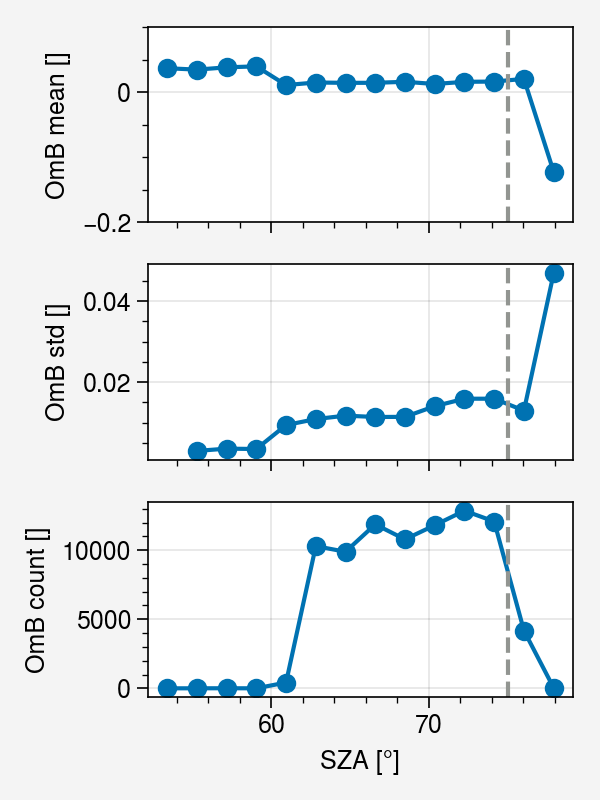

In [61]:
fig, axes = plt.subplots(3, 1, figsize=(3, 4), sharex=True)

axes[0].plot(
    binned["SZA_bin"].to_numpy(),
    binned["OmB_mean"].to_numpy(),
    marker="o"
)
axes[0].set_ylabel("OmB mean []")
axes[0].axvline(x=75, color="grey", linestyle="--")
axes[0].grid(True)

axes[1].plot(
    binned["SZA_bin"].to_numpy(),
    binned["OmB_std"].to_numpy(),
    marker="o"
)

axes[2].plot(
    binned["SZA_bin"].to_numpy(),
    binned["OmB_count"].to_numpy(),
    marker="o"
)

axes[1].set_ylabel("OmB std []")
axes[1].axvline(x=75, color="grey", linestyle="--")
axes[1].grid(True)
axes[0].set_ylim(-0.2, 0.1)

axes[2].set_ylabel("OmB count []")
axes[2].set_xlabel("SZA [°]")
axes[2].axvline(x=75, color="grey", linestyle="--")

plt.tight_layout()
plt.show()

### New plot using assumptions of Philipp


In [25]:
all_dfs = [] # All dataframes includes dataframe of data at each selected hour
df_v1 = []
df_v2 = []
df_v3 = []

correction_filters = {
    "default": lambda T12: flatten_data(H) < np.inf,  # No correction
    "v1": lambda T12: ~(flatten_data(SZA) > 75), # Exclude pixels with sza > 75 degrees
    "v2": lambda T12: ~(flatten_data(H) > 2), # Exclude pixels with terrain > 2 km
    "v3": lambda T12: ~((flatten_data(SZA) > 75) | (flatten_data(H) > 2)), # Exlude pixels either > 2 km or sza > 75 degrees
}

def flatten_data(x):
    y1 = x.flatten()
    y2 = y1[~np.isnan(y1)]
    return y2

time_slice = ["060000","090000","120000","150000"]
#time_slice = ["060000"]
for hour in time_slice:

    sza = flatten_data(rttov122.angles["SZA"][hour].values*domain_mask)
    vza = flatten_data(rttov122.angles["VZA"][hour].values*domain_mask)
    sca = flatten_data(rttov122.angles["SCA"][hour].values*domain_mask)
    albedo = flatten_data(rttov122.albedo_from_atlas[hour].values*domain_mask)
    terrain = flatten_data(H)
    obs = visop.clear_observed[hour].values*domain_mask
    omb1 = flatten_data(obs) - flatten_data(rttov122.clear_synthetic["darkest-pixel"][hour].values*domain_mask)
    omb2 = flatten_data(obs) - flatten_data(rttov132.clear_synthetic["darkest-pixel"][hour].values*domain_mask)
   
    # filter out departures larger than 0.05 to remove pixels most likely affected by misreprested snow whether in O or B
    SZA = rttov122.angles["SZA"][hour].values*domain_mask
    mask_f1 = correction_filters["default"](omb2)
    
    df1 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb1[mask_f1]}) # V122
    df2 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb2[mask_f1]}) # V132
    all_dfs.extend([df1, df2])

    
    mask_f1 = correction_filters["v1"](omb2)
    df1 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb1[mask_f1]}) # V122
    df2 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb2[mask_f1]}) # V132
    df_v1.extend([df1, df2])

    mask_f1 = correction_filters["v2"](omb2)
    
    df1 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb1[mask_f1]}) # V122
    df2 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb2[mask_f1]}) # V132
    df_v2.extend([df1, df2])

    mask_f1 = correction_filters["v3"](omb2)
    
    df1 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb1[mask_f1]}) # V122
    df2 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb2[mask_f1]}) # V132
    df_v3.extend([df1, df2])

In [56]:
def bin_data(df, variable, min_count=50):
    
    # Same fixed bin edges as Philipps
    if variable == 'SZA':
        bins = np.linspace(0, 90, 19 + 9)
    elif variable == 'terrain':
        bins = np.linspace(0, 4, 17)
    elif variable == 'SCA':
        bins = np.linspace(0, 150, 19 + 9)
    else:
        raise ValueError(f"Unknown variable: {variable}")

    df = df.copy()

    # Assign values to fixed bins
    df[variable + '_bin'] = pd.cut(
        df[variable],
        bins=bins,
        include_lowest=True
    )

    # Calculate mean, std, and size per bin
    binned_data = (
        df.groupby(variable + '_bin', observed=True)
          .agg(
              OmB_mean=('OmB', 'mean'),
              OmB_std=('OmB', lambda x: np.nanstd(x)),
              OmB_count=('OmB', 'size')   # counts all rows, including NaN OmB
          )
          .reset_index()
    )

    # Add bin center for plotting
    binned_data[variable + '_bin_center'] = binned_data[variable + '_bin'].apply(
        lambda x: x.mid
    )

    # Apply minimum-count condition
    # Use <= if you want to match the original function exactly:
    # original condition was: len(...) > min_count
    binned_data.loc[
        binned_data['OmB_count'] <= min_count,
        ['OmB_mean', 'OmB_std']
    ] = np.nan

    return binned_data

            SZA_bin  OmB_mean   OmB_std  OmB_count SZA_bin_center
0  (53.333, 56.667]       NaN       NaN          4        55.0000
1    (56.667, 60.0]       NaN       NaN          9        58.3335
2    (60.0, 63.333]  0.011922  0.010197       2515        61.6665
3  (63.333, 66.667]  0.014804  0.011364      18494        65.0000
4    (66.667, 70.0]  0.014906  0.011329      19778        68.3335
5    (70.0, 73.333]  0.014429  0.014158      21480        71.6665
6  (73.333, 76.667]  0.016457  0.016135      20688        75.0000
7    (76.667, 80.0]  0.014346  0.027160       1284        78.3335
              SCA_bin  OmB_mean   OmB_std  OmB_count SCA_bin_center
0    (88.889, 94.444]  0.005368  0.010181       5513        91.6665
1     (94.444, 100.0]  0.014313  0.009965      18882        97.2220
2    (100.0, 105.556]  0.010809  0.013214      24603       102.7780
3  (105.556, 111.111]  0.018717  0.012890      24047       108.3335
4  (111.111, 116.667]  0.022281  0.017021      10494       113.889

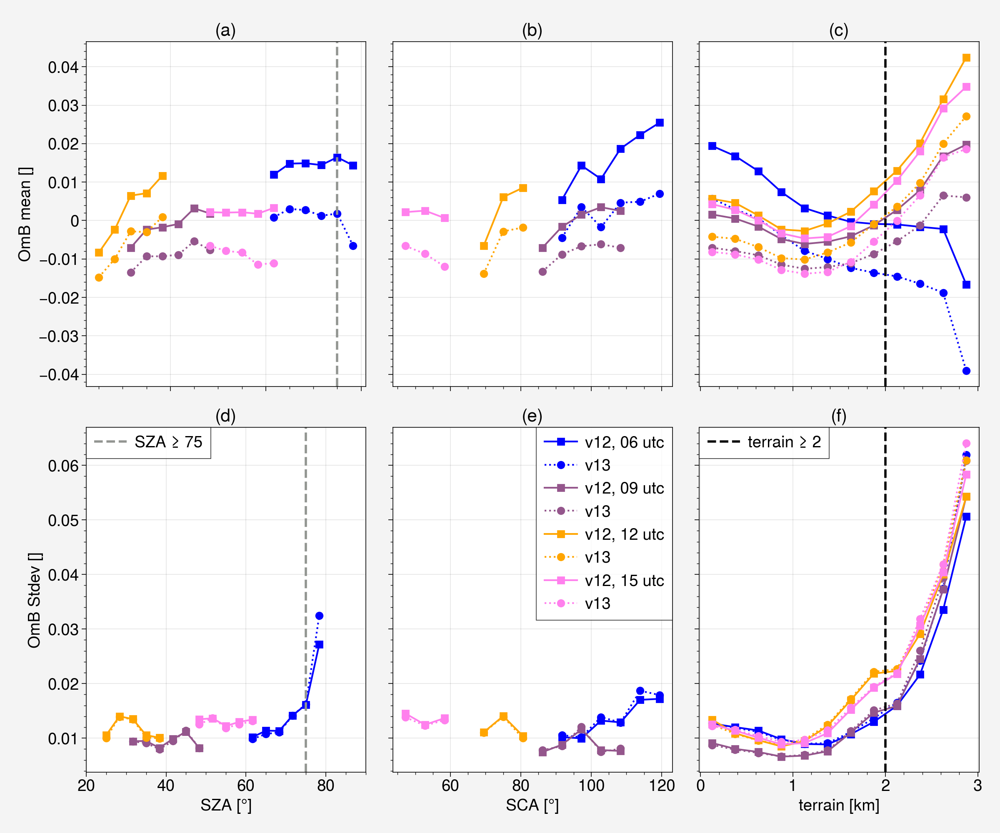

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

variables = ["SZA", "SCA", "terrain"]  # ['VZA', 'SZA', 'SCA', 'terrain']
units = ["[°]", "[°]", "[km]"]
set_colors = ['blue', 'purple', '#ffa500', '#ff80ed', 'orange']

plt.rcParams.update({'font.size': 14})


def make_bin_numeric(df, bin_col):
    """
    Convert bin column to numeric values.
    Handles pandas Interval bins by using bin midpoints.
    """
    if df.empty or bin_col not in df.columns:
        return df

    valid_values = df[bin_col].dropna()

    if valid_values.empty:
        df[bin_col] = np.nan
        return df

    first_valid = valid_values.iloc[0]

    if hasattr(first_valid, "mid"):
        df[bin_col] = df[bin_col].apply(
            lambda x: x.mid if pd.notna(x) else np.nan
        )
    else:
        df[bin_col] = pd.to_numeric(df[bin_col], errors="coerce")

    return df


def clean_plot_data(df, x_col, y_col):
    """
    Keep only valid numeric x/y values and return numpy arrays.
    This avoids the pandas multidimensional indexing error.
    """
    df = df.copy()

    df[x_col] = pd.to_numeric(df[x_col], errors="coerce")
    df[y_col] = pd.to_numeric(df[y_col], errors="coerce")

    df = df[[x_col, y_col]].dropna()
    df = df.sort_values(x_col)

    x = df[x_col].to_numpy(dtype=float)
    y = df[y_col].to_numpy(dtype=float)

    return x, y


# Create subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 10), sharey='row')

# Loop through each pair of DataFrames: v12 and v13
for set_num, (df1, df2) in enumerate(zip(all_dfs[::2], all_dfs[1::2])):

    data_list1 = []
    data_list2 = []
    for var in variables:
        bin_col = var + "_bin"

        d1 = bin_data(df1.copy(), var)
        d2 = bin_data(df2.copy(), var)
        print(d1)
        d1 = make_bin_numeric(d1, bin_col)
        d2 = make_bin_numeric(d2, bin_col)

        d1["OmB_mean"] = pd.to_numeric(d1["OmB_mean"], errors="coerce")
        d1["OmB_std"] = pd.to_numeric(d1["OmB_std"], errors="coerce")
        d2["OmB_mean"] = pd.to_numeric(d2["OmB_mean"], errors="coerce")
        d2["OmB_std"] = pd.to_numeric(d2["OmB_std"], errors="coerce")

        data_list1.append(d1)
        data_list2.append(d2)

    current_color = set_colors[set_num]

    for i, var in enumerate(variables):
        bin_col = var + "_bin"

        label_v12 = f'v12, {time_slice[set_num][:2]} utc'
        label_v13 = 'v13'

        # -------------------------
        # Row 1: OmB mean
        # -------------------------
        x1, y1 = clean_plot_data(data_list1[i], bin_col, "OmB_mean")
        x2, y2 = clean_plot_data(data_list2[i], bin_col, "OmB_mean")

        axes[0, i].plot(
            x1,
            y1,
            color=current_color,
            marker='s',
            linestyle='-'
        )

        axes[0, i].plot(
            x2,
            y2,
            color=current_color,
            marker='o',
            linestyle='dotted'
        )

        axes[0, i].set_title(f'({chr(ord("a") + i)})')
        axes[0, i].set_ylabel('OmB mean []' if i == 0 else '')
        axes[0, i].set_xlabel('')
        axes[0, i].tick_params(labelbottom=False)
        #axes[0, i].set_ylim(-0.08, 0.05)

        # -------------------------
        # Row 2: OmB standard deviation
        # -------------------------
        x1, y1 = clean_plot_data(data_list1[i], bin_col, "OmB_std")
        x2, y2 = clean_plot_data(data_list2[i], bin_col, "OmB_std")

        axes[1, i].plot(
            x1,
            y1,
            color=current_color,
            marker='s',
            linestyle='-',
            label=label_v12 if i == 1 else None
        )

        axes[1, i].plot(
            x2,
            y2,
            color=current_color,
            marker='o',
            linestyle='dotted',
            label=label_v13 if i == 1 else None
        )

        axes[1, i].set_title(f'({chr(ord("a") + i + 3)})')
        axes[1, i].set_xlabel(var + " " + units[i])
        axes[1, i].set_ylabel('OmB Stdev []' if i == 0 else '')
        

# Grid
for ax in axes.flatten():
    ax.grid(True)

# Threshold lines
axes[0, 0].axvline(x=75, color='grey',linestyle='--',linewidth=2)

axes[1, 0].axvline(x=75,color='grey',linestyle='--',linewidth=2,label="SZA ≥ 75")

axes[0, 2].axvline(x=2,color='black',linestyle='--',linewidth=2)

axes[1, 2].axvline(x=2, color='black', linestyle='--', linewidth=2,label="terrain ≥ 2")

# Legends
axes[1,1].legend(loc='best')
axes[1, 0].legend(loc='upper left')
axes[1, 2].legend(loc='upper left')
axes[1, 0].set_xlim(20,90)

plt.tight_layout()
plt.subplots_adjust(top=0.95)

plt.savefig(
    '/home/km4c/to_ucloud/OmB_stats_angles_terrain.png',
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [48]:
df_test

,terrain_bin,OmB_mean,OmB_std,OmB_count,terrain_bin_center
0,0.1245,0.004252,0.012533,33500,0.1245
1,0.3750,0.002799,0.011365,21484,0.3750
2,0.6250,0.000097,0.010081,10520,0.6250
3,0.8750,-0.003351,0.008857,5363,0.8750
4,1.1250,-0.004660,0.009098,3238,1.1250
5,1.3750,-0.004257,0.010917,1992,1.3750
6,1.6250,-0.001480,0.015204,1287,1.6250
7,1.8750,0.004142,0.019252,929,1.8750
8,2.1250,0.010370,0.021779,795,2.1250
9,2.3750,0.018008,0.030591,629,2.3750


## OmB dependence on angles, terrain, albedo

In [23]:
all_dfs = [] # All dataframes includes dataframe of data at each selected hour
df_v1 = []
df_v2 = []
df_v3 = []

correction_filters = {
    "default": lambda T12: flatten_data(H) < np.inf,  # No correction
    "v1": lambda T12: ~(flatten_data(SZA) > 75), # Exclude pixels with sza > 75 degrees
    "v2": lambda T12: ~(flatten_data(H) > 2), # Exclude pixels with terrain > 2 km
    "v3": lambda T12: ~((flatten_data(SZA) > 75) | (flatten_data(H) > 2)), # Exlude pixels either > 2 km or sza > 75 degrees
}

def flatten_data(x):
    y1 = x.flatten()
    y2 = y1[~np.isnan(y1)]
    return y2

time_slice = ["060000","090000","120000","150000"]
#time_slice = ["060000"]
for hour in time_slice:

    sza = flatten_data(rttov122.angles["SZA"][hour].values*domain_mask)
    vza = flatten_data(rttov122.angles["VZA"][hour].values*domain_mask)
    sca = flatten_data(rttov122.angles["SCA"][hour].values*domain_mask)
    albedo = flatten_data(rttov122.albedo_from_atlas[hour].values*domain_mask)
    terrain = flatten_data(H)
    obs = visop.clear_observed[hour].values*domain_mask
    omb1 = flatten_data(obs) - flatten_data(rttov122.clear_synthetic["darkest-pixel"][hour].values*domain_mask)
    omb2 = flatten_data(obs) - flatten_data(rttov132.clear_synthetic["darkest-pixel"][hour].values*domain_mask)
   
    # filter out departures larger than 0.05 to remove pixels most likely affected by misreprested snow whether in O or B
    SZA = rttov122.angles["SZA"][hour].values*domain_mask
    mask_f1 = correction_filters["default"](omb2)
    
    df1 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb1[mask_f1]}) # V122
    df2 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb2[mask_f1]}) # V132
    all_dfs.extend([df1, df2])

    
    mask_f1 = correction_filters["v1"](omb2)
    df1 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb1[mask_f1]}) # V122
    df2 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb2[mask_f1]}) # V132
    df_v1.extend([df1, df2])

    mask_f1 = correction_filters["v2"](omb2)
    
    df1 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb1[mask_f1]}) # V122
    df2 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb2[mask_f1]}) # V132
    df_v2.extend([df1, df2])

    mask_f1 = correction_filters["v3"](omb2)
    
    df1 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb1[mask_f1]}) # V122
    df2 = pd.DataFrame({'SZA': sza[mask_f1], 'VZA': vza[mask_f1], 'albedo': albedo[mask_f1], 'terrain': terrain[mask_f1], 'SCA': sca[mask_f1], 'OmB': omb2[mask_f1]}) # V132
    df_v3.extend([df1, df2])

In [39]:
def bin_data(df, variable, n_bins=15):
    bins = np.linspace(df[variable].min(), df[variable].max(), n_bins + 1)

    df[variable + "_bin"] = pd.cut(df[variable], bins=bins, include_lowest=True)

    binned_data = (
        df.groupby(variable + "_bin", observed=True)
          .agg(OmB_mean=("OmB", "mean"), OmB_std=("OmB", "std"))
          .reset_index()
    )

    # Convert interval bins to numeric bin centers for plotting
    binned_data[variable + "_bin"] = binned_data[variable + "_bin"].apply(lambda x: x.mid)

    return binned_data

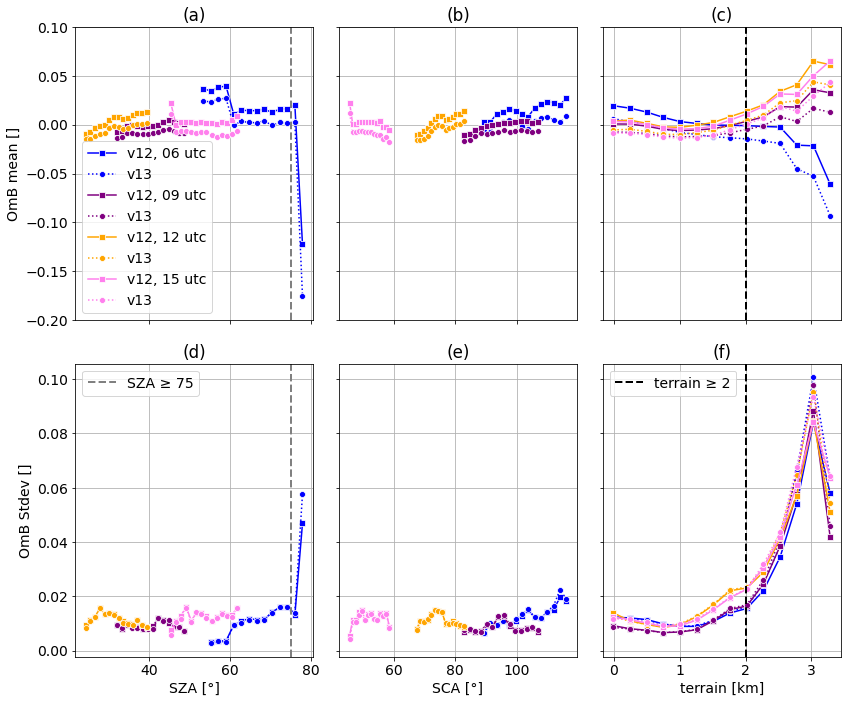

In [18]:
variables = ["SZA", "SCA", 'terrain'] # ['VZA', 'SZA', 'SCA', 'terrain']
units = ["[°]", "[°]", "[km]"]
set_colors = ['blue', 'purple', '#ffa500','#ff80ed', 'orange']
# Create subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 10), sharey='row')
plt.rcParams.update({'font.size': 14})

# Collect legend handles and labels
handles, labels = [], []

# Loop through each set of DataFrames
for set_num, (df1, df2) in enumerate(zip(all_dfs[::2], all_dfs[1::2])):
    data_list1 = [bin_data(df1.copy(), var) for var in variables]
    data_list2 = [bin_data(df2.copy(), var) for var in variables]
    current_color = set_colors[set_num]

    for i, var in enumerate(variables):
        # Plot mean bias
        if i == 0:
            sns.lineplot(ax=axes[0, i], x=var + '_bin', y='OmB_mean', data=data_list1[i],
                         color=current_color, marker='s', linestyle='-', label=f'v12, {time_slice[set_num][:2]} utc')
            sns.lineplot(ax=axes[0, i], x=var + '_bin', y='OmB_mean', data=data_list2[i],
                         color=current_color, marker='o', linestyle='dotted', label=f'v13')
            # Collect handles and labels (only for the first subplot)
            handles, labels = axes[0, i].get_legend_handles_labels()
        else:
            sns.lineplot(ax=axes[0, i], x=var + '_bin', y='OmB_mean', data=data_list1[i],
                         color=current_color, marker='s', linestyle='-')
            sns.lineplot(ax=axes[0, i], x=var + '_bin', y='OmB_mean', data=data_list2[i],
                         color=current_color, marker='o', linestyle='dotted')

        axes[0, i].set_title(f'({chr(ord("a") + i)})')
        axes[0, i].set_ylabel('OmB mean []' if i == 0 else '')
        axes[0, i].set_xticklabels([])
        axes[0, i].set_xlabel('')
        axes[0, i].set_ylim(-0.2, 0.1)
        # Plot standard deviation
        sns.lineplot(ax=axes[1, i], x=var + '_bin', y='OmB_std', data=data_list1[i],
                     color=current_color, marker='s', linestyle='-')
        sns.lineplot(ax=axes[1, i], x=var + '_bin', y='OmB_std', data=data_list2[i],
                     color=current_color, marker='o', linestyle='dotted')
        axes[1, i].set_title(f'({chr(ord("a") + i + 3)})')
        axes[1, i].set_xlabel(var+" "+units[i])
        axes[1, i].set_ylabel('OmB Stdev []' if i == 0 else '')

for ax in axes.flatten():
    ax.grid(True)

# after drawing the vlines on the second row…
axes[0, 0].axvline(x=75, color='grey', linestyle='--', linewidth=2, label="SZA ≥ 75")
axes[0, 2].axvline(x=2,  color='black', linestyle='--', linewidth=2, label="terrain ≥ 2")
axes[1, 0].axvline(x=75, color='grey', linestyle='--', linewidth=2, label="SZA ≥ 75")
axes[1, 2].axvline(x=2,  color='black', linestyle='--', linewidth=2, label="terrain ≥ 2")

# now put legends on *those* axes:
axes[1, 0].legend(loc='upper left')
axes[1, 2].legend(loc='upper left')

plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust top spacing to accommodate the legend
plt.show
plt.savefig('/home/km4c/to_ucloud/OmB_stats_angles_terrain.png')